# Limpieza y modelado de los datos de generación por parte de placas solares

El objetivo es limpiar el dataset y modelar el conocimiento para poder realizar regresión de la variable objetivo "y" (energía exportada)

## Notas:
- Muchas mediciones con radiacion cero, por tanto no generan. ¿Eliminar las mediciones nocturnas? -> Es buena idea pues balancea la importancia de las mediciones diurnas. Al eliminar una gran cantidad de mediciones iguales, se aprecian mas facilmente los patrones que nos pudieran interesar.

## Ideas:
+ Capar a cero los valores de "y" (como mínimo), radiación, ...
+ Eliminar las entradas correspondientes a mediciones nocturnas (Probando)
+ Sustituir outliers por mediciones de otras estaciones (Hecho con temperaturas y con radiacion solar, copiamos los valores del dia siguiente)

## Carga de librerias

In [1]:
if "google.colab" in str(get_ipython()):
    !pip install git+https://github.com/ourownstory/neural_prophet.git # may take a while
    !pip install statsforecast
    #!pip install neuralprophet # much faster, but may not have the latest upgrades/bugfixes

    import gc
import pandas as pd
import numpy as np
import sklearn
import itertools
import pickle
import statsmodels.api as sm
import pmdarima as pm
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.io as pio
#pio.renderers.default="notebook"


from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA

from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from skforecast.model_selection_statsmodels import grid_search_sarimax
from sklearn.ensemble import RandomForestRegressor

from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly
from prophet.serialize import model_to_json, model_from_json

from neuralprophet import NeuralProphet, set_log_level
from neuralprophet import save
from neuralprophet import load

from pycaret.regression import *
from pycaret import time_series as ts
from pycaret.time_series import TSForecastingExperiment

import warnings
warnings.filterwarnings("ignore")

/home/ercos/.local/lib/python3.10/site-packages/statsforecast/core.py:21: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
/usr/lib/python3/dist-packages/pkg_resources/__init__.py:116: PkgResourcesDeprecationWarning: 1.1build1 is an invalid version and will not be supported in a future release
  warnings.warn(
/usr/lib/python3/dist-packages/pkg_resources/__init__.py:116: PkgResourcesDeprecationWarning: 0.1.43ubuntu1 is an invalid version and will not be supported in a future release
  warnings.warn(
torch.distributed.nn.jit.instantiator INFO  Created a temporary directory at /tmp/tmpxs_122gb
torch.distributed.nn.jit.instantiator INFO  Writing /tmp/tmpxs_122gb/_remote_module_non_scriptable.py


## Definición de funciones 

In [2]:
def plot_dataframe_structure(df):
    """
    Plot dataframe structure: It shows the different data types in the dataframe.

    Parameters
    ----------
    df: Pandas dataframe
    
    Returns
    -------
    Plotting
    """
    plt.figure()
    df.dtypes.value_counts().plot.pie(ylabel='')
    plt.title('Data types')
    plt.show()

def plot_categorical(df):
    """
    Plot the number of different values for each categorical feature in the dataframe.

    Parameters
    ----------
    df: Pandas dataframe
    
    Returns
    -------
    Plotting
    """
    plt.figure()
    df.nunique().plot.bar()
    plt.title('Number of different values')
    plt.show()
    
def duplicates(df):
    """
    Remove the duplicate rows from dataframe.

    Parameters
    ----------
    df: Pandas dataframe
    
    Returns
    -------
    df: Pandas dataframe without duplicate rows 
    """    
    duplicate_rows_df = df[df.duplicated()]
    if duplicate_rows_df.shape[0] > 0:
       print('Number of rows before removing:', df.count()[0])
       print('Number of duplicate rows:', duplicate_rows_df.shape[0])
       df = df.drop_duplicates()
       print('Number of rows after removing:', df.count()[0])
    else:
       print('No duplicate rows.')
    return df

def drop_na(df, threshold_NaN):
    """
    Remove the columns from dataframe containing NaN depending on threshold_NaN.

    Parameters
    ----------
    df: Pandas dataframe
    threshold_NaN: in [0, 1], from GUI
    
    Returns
    -------
    df: Pandas dataframe 
    drop_cols: list of dropped columns
    """    
    isna_stat = (df.isna().sum()/df.shape[0]).sort_values(ascending=True)
    drop_cols = []
    if isna_stat.max() > 0.0:
       drop_cols = np.array(isna_stat[isna_stat > threshold_NaN].index)
       print('Drop columns containing more than', threshold_NaN*100,'% of NaN:', drop_cols)
       df = df.drop(drop_cols, axis=1)
    else:
       print('No need to drop columns.')
    return df, drop_cols

def add_datetime_features(df):
    """
    Add the columns from dataframe containing different date aspects separately

    Parameters
    ----------
    df: Pandas dataframe
    
    Returns
    -------
    df: Pandas dataframe 
    """
    df["minute"] = df['ds'].dt.minute
    df["hour"] = df['ds'].dt.hour
    df["day"] = df['ds'].dt.day
    df["week"] = df['ds'].dt.isocalendar().week
    df["month"] = df['ds'].dt.month
    df["year"] = df['ds'].dt.year
    return df

def sarimax_gridsearch(ts, pdq, pdqs, maxiter=50, freq='M'):
    '''
    Input: 
        ts : your time series data
        pdq : ARIMA combinations from above
        pdqs : seasonal ARIMA combinations from above
        maxiter : number of iterations, increase if your model isn't converging
        frequency : default='M' for month. Change to suit your time series frequency
            e.g. 'D' for day, 'H' for hour, 'Y' for year. 
        
    Return:
        Prints out top 5 parameter combinations
        Returns dataframe of parameter combinations ranked by BIC
    '''

    # Run a grid search with pdq and seasonal pdq parameters and get the best BIC value
    ans = []
    for comb in pdq:
        for combs in pdqs:
            try:
                mod = sm.tsa.statespace.SARIMAX(ts, # this is your time series you will input
                                                order=comb,
                                                seasonal_order=combs,
                                                enforce_stationarity=False,
                                                enforce_invertibility=False,
                                                freq=freq)

                output = mod.fit(maxiter=maxiter) 
                ans.append([comb, combs, output.bic])
                print('SARIMAX {} x {}12 : BIC Calculated ={}'.format(comb, combs, output.bic))
            except:
                continue
            
    # Find the parameters with minimal BIC value

    # Convert into dataframe
    ans_df = pd.DataFrame(ans, columns=['pdq', 'pdqs', 'bic'])

    # Sort and return top 5 combinations
    ans_df = ans_df.sort_values(by=['bic'],ascending=True)[0:5]
    
    return ans_df

def evaluate(predicted, actual):
    
    """
    Prints different metrics related to the quality of a prediction
    
    Parameters:
    -----------
    predictions : pandas.Series
        Pandas series with the model predictions.
    actuals : pandas.Series
        Pandas series with the actual values.
    
    Returns:
    --------
    nothing
    """
    
    # Convert actual and predicted to numpy
    # array data type if not already
    if not all([isinstance(actual, np.ndarray), 
                isinstance(predicted, np.ndarray)]):
        actual = np.array(actual)
        predicted = np.array(predicted)
        
    errors = abs(predicted - actual)
    
    with np.errstate(divide='ignore', invalid='ignore'):
        c = np.true_divide(errors, abs(actual))
        c[c == np.inf] = 0
        #c[c == -np.inf] = 0
        c = np.nan_to_num(c)

    mape = float(100) * np.mean(c)
    accuracy = float(100) - mape
    smape_error = smape(predicted, actual)
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('SMAPE: {:0.4f}'.format(smape_error))
    

def smape(predictions, actuals):
    """
    Calculates the SMAPE metric between predictions and actuals given as pandas series.
    
    Parameters:
    -----------
    predictions : pandas.Series
        Pandas series with the model predictions.
    actuals : pandas.Series
        Pandas series with the actual values.
    
    Returns:
    --------
    float
        SMAPE value.
    """
    epsilon = 1e-10  # A small constant to avoid division by zero
    denominator = (np.abs(predictions) + np.abs(actuals)) / 2.0 + epsilon
    numerator = np.abs(predictions - actuals)
    return np.mean(numerator / denominator) * 100


def to_yhat1_along(model, df):
    if model.n_lags != 0:
        new_df = pd.DataFrame(index=df)
        x = 0
        for row in range(len(df)):
            if df.loc[row]["yhat1"] == None or np.isnan(np.min(df.loc[row]["yhat1"])):
                x = row + 1
            else:
                break
        for row in range(len(new_df)):
            try:
                new_df.loc[row + x, "yhat1"] = df.loc[row + x]["yhat" + str(row + 1)]
            except:
                pass
        new_df = new_df.dropna(subset=['yhat1'])
        return new_df
    
def grow_dataframe(df, n, frequency):  
    
    last_date = df.index[-1]
    
    # Creamos un nuevo rango de fechas a partir de la última fecha
    new_dates = pd.date_range(start=last_date, freq=frequency, periods=n+1)

    # Creamos un diccionario con las columnas y valores a cero
    new_values = {col: 0 for col in df.columns}

    # Creamos un DataFrame con los nuevos valores y fechas
    df_new = pd.DataFrame(new_values, index=new_dates)
    df_new = df_new[1:]
    
    # Agregamos el nuevo DataFrame al original utilizando el método append
    df_final = pd.concat([df,df_new])
    return df_final
    
    
def future_prediction_validation(model, future_df, actual_df):   
    results_df = future_df.copy(deep=True)
    
    batch_size = model.n_forecasts
    total_size = future_df.shape[0]
    
    lags = model.n_lags

    if(lags > 0):
        total_size = total_size - lags
        
    results_df['prediction'] = 0.0
    
    
    batchs = total_size // batch_size
    remaining = total_size % batch_size
    
    #print('Para el total de filas, se ejecutaran ', batchs, ' batchs de tamaño ', batch_size, )
    
    if(batchs >= 1):
        batch = 0
        while(batch <= batchs):
            step = (batch * batch_size)
            
            #print('Prediciendo desde la fila ', step, ' hasta la fila ', step + batch_size + lags, ' teniendo en cuenta que hay', lags, 'lags y que se predicen ', batch_size, 'hacia el futuro')
            
            historic = actual_df[step : step + lags]
            predicted_regressors = future_df[step : step + batch_size]
            window = pd.concat([historic, predicted_regressors])
            
            predicted_values = model.predict(window) 
            predicted_values = to_yhat1_along(model, predicted_values)
            predicted_values = predicted_values['yhat1'].array
            
            #future_df.iloc[step + lags : step + lags + batch_size].loc[:, 'y'] = predicted_values
            results_df.iloc[step : step + batch_size].loc[:, 'prediction'] = predicted_values
            
            batch = batch + 1
                  
        if(remaining > 0):
            
            step = (batch * batch_size)
            rest = actual_df[step:]
            fill = batch_size + lags - rest.shape[0]

            #print('Step: ', step, '  Remaining: ', remaining, '  Tamaño del rest:', rest.shape[0], '  fill:', fill)
            rest.set_index('ds', inplace=True)
            rest = grow_dataframe(rest, fill, '15T')  
            rest.reset_index(inplace=True) 
            rest.rename(columns={'index': 'ds'}, inplace=True)

            predicted_values = model.predict(rest) 
            predicted_values = to_yhat1_along(model, predicted_values)

            predicted_values = predicted_values.iloc[:remaining]

            results_df.iloc[step : step + remaining].loc[:, 'prediction'] = predicted_values['yhat1'].array
    return results_df
        

## Carga del csv

In [3]:
urlIter = 'https://raw.githubusercontent.com/alu0101325583/CSVs/main/ITER/solar_iter_consignas.csv'
urlArico = 'https://raw.githubusercontent.com/alu0101325583/CSVs/main/ITER/solar_arico_consignas.csv'
urlFuturoIter = 'https://raw.githubusercontent.com/alu0101325583/CSVs/main/ITER/Febrero%20Todo%20ITER.csv'

df = pd.read_csv(urlIter) # dataframe inicial
df = df[:-96]

df2 = pd.read_csv(urlArico) #dataframe para la sutitucion de outliers por errores en la medición
df2 =df2[:-96]

dfFutureIter = pd.read_csv(urlFuturoIter)

## Análisis inicial del dataframe

### Visualizamos la información básica del dataframe:

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60906 entries, 0 to 60905
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        60906 non-null  object 
 1   y                 60906 non-null  float64
 2   wind_speed        60906 non-null  float64
 3   wind_dir_sin      60906 non-null  float64
 4   wind_dir_cos      60906 non-null  float64
 5   solar_irradiance  60906 non-null  float64
 6   temp              60906 non-null  float64
 7   pressure          60906 non-null  float64
 8   humidity          60906 non-null  float64
 9   setpoints         60906 non-null  float64
 10  altitude          60906 non-null  float64
 11  ds                60906 non-null  object 
dtypes: float64(10), object(2)
memory usage: 5.6+ MB


### Visualizamos algunas características estadísticas de los datos almacenados en el dataframe:

In [5]:
display(df.describe().T)

,count,mean,std,min,25%,50%,75%,max
y,60906.0,-97.774816,134.967541,-450.000000,-194.687500,-3.062500,0.000000,0.750000
wind_speed,60906.0,5.869682,3.047153,0.000000,3.394917,5.629720,8.025750,16.976000
wind_dir_sin,60906.0,0.435819,0.591476,-1.000000,0.104528,0.706194,0.892271,1.000000
wind_dir_cos,60906.0,0.413355,0.537928,-1.000000,0.224573,0.560205,0.809632,1.000000
solar_irradiance,60906.0,215.771557,312.973147,0.000000,0.000000,0.012162,419.113470,1426.566667
temp,60906.0,19.650439,10.530890,10.679775,16.950000,19.072222,20.776404,267.000000
pressure,60906.0,1014.867215,3.337312,999.486000,1012.665000,1014.730000,1016.815000,1026.490000
humidity,60906.0,68.804857,14.108314,0.000000,63.859663,71.479888,77.601951,96.988764
setpoints,60906.0,472.470823,105.978892,0.000000,500.000000,500.000000,500.000000,500.000000
altitude,60906.0,-0.784876,41.573631,-85.262909,-35.918672,0.345819,34.430062,85.264992


### Mostramos el número de valores diferentes que posee cada variable para así identificar si existe alguna variable categórica:

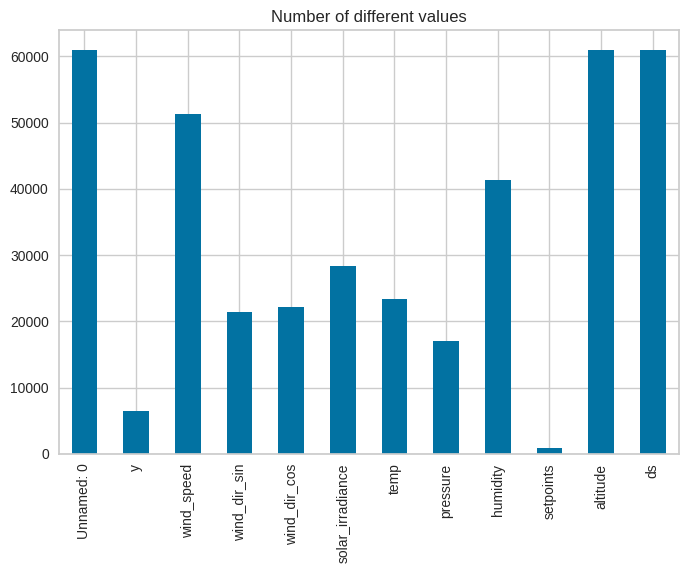

In [6]:
plot_categorical(df)

La variable "y" es la variable a predecir, asi que la descartamos del proceso de categorización. También descartamos las variables temporales que hemos generado de forma artificial.
De resto, se observa que las variables poseen una alta cantida de valores diferentes, y por tanto dificilmente serán categóricas.

## Limpieza inicial

### Normalizamos la Y
Los valores de energía están en negativo, los pasamos a positivo.

In [7]:
df['y'] = df['y'].mul(-1)
df2['y'] = df2['y'].mul(-1)

### Comprobamos si existen filas duplicadas

In [8]:
duplicates(df)

No duplicate rows.


,Unnamed: 0,y,wind_speed,wind_dir_sin,wind_dir_cos,solar_irradiance,temp,pressure,humidity,setpoints,altitude,ds
0,2021-06-25 12:30:00,420.1250,7.620000,0.996493,0.083678,973.12,18.900000,1017.110,65.140000,500.0,81.652300,2021-06-25 12:30:00
1,2021-06-25 12:45:00,422.6875,7.480000,0.997649,0.068538,975.41,19.040000,1017.050,66.740000,500.0,81.652300,2021-06-25 12:45:00
2,2021-06-25 13:00:00,425.2500,7.140000,0.993768,0.111469,911.84,19.020000,1016.900,66.120000,500.0,81.652300,2021-06-25 13:00:00
3,2021-06-25 13:15:00,424.1875,7.610000,0.983350,0.181721,978.01,18.980000,1016.670,65.970000,500.0,81.652300,2021-06-25 13:15:00
4,2021-06-25 13:30:00,423.1250,7.550000,0.997801,0.066274,971.63,19.040000,1016.555,66.490000,500.0,81.652300,2021-06-25 13:30:00
...,...,...,...,...,...,...,...,...,...,...,...,...
60901,2023-03-21 21:45:00,-0.0625,9.054545,0.837814,0.545956,0.00,16.594318,1011.450,71.404545,500.0,-34.229401,2023-03-21 21:45:00
60902,2023-03-21 22:00:00,-0.0000,8.074667,0.814116,0.580703,0.00,16.502222,1011.775,70.024444,500.0,-37.274029,2023-03-21 22:00:00
60903,2023-03-21 22:15:00,-0.0000,7.670000,0.784452,0.620190,0.00,16.393333,1011.900,69.651111,500.0,-40.251458,2023-03-21 22:15:00
60904,2023-03-21 22:30:00,-0.0000,8.103483,0.790262,0.612769,0.00,16.396629,1011.950,69.394382,500.0,-43.147652,2023-03-21 22:30:00


### Comprobamos si existen columnas con valores NaN, en cuyo caso las eliminamos si más de un 50% de sus valores son de ese tipo.

In [9]:
nan_cols = df.columns[df.isna().any()].tolist()
print(nan_cols)
if nan_cols:
  df, drop_cols = drop_na(df, 0.5)

[]


### Eliminamos la columna unnamed 0, que representa la fecha, puesto que es redundante respecto a la columna ds.

In [10]:
df = df.drop('Unnamed: 0', axis=1)
df2 = df2.drop('Unnamed: 0', axis=1)
dfFutureIter = dfFutureIter.drop('Unnamed: 0', axis=1)

### Tambien eliminamos la columna workhours porque no sirve para nada.

### Vemos que la columna ds no es del tipo de dato datetime, útil para el análisis de series temporales.
Lo convertimos a este tipo de dato manteniendo el formato dado:

In [11]:
df['ds'] = pd.to_datetime(df['ds'], format='%Y-%m-%d %H:%M:%S')
df2['ds'] = pd.to_datetime(df2['ds'], format='%Y-%m-%d %H:%M:%S')
dfFutureIter['ds'] = pd.to_datetime(dfFutureIter['ds'], format='%Y-%m-%d %H:%M:%S')

df.set_index('ds', inplace=True)
df2.set_index('ds', inplace=True)
dfFutureIter.set_index('ds', inplace=True)

df.head()

,y,wind_speed,wind_dir_sin,wind_dir_cos,solar_irradiance,temp,pressure,humidity,setpoints,altitude
ds,,,,,,,,,,
2021-06-25 12:30:00,420.1250,7.62,0.996493,0.083678,973.12,18.90,1017.110,65.14,500.0,81.6523
2021-06-25 12:45:00,422.6875,7.48,0.997649,0.068538,975.41,19.04,1017.050,66.74,500.0,81.6523
2021-06-25 13:00:00,425.2500,7.14,0.993768,0.111469,911.84,19.02,1016.900,66.12,500.0,81.6523
2021-06-25 13:15:00,424.1875,7.61,0.983350,0.181721,978.01,18.98,1016.670,65.97,500.0,81.6523
2021-06-25 13:30:00,423.1250,7.55,0.997801,0.066274,971.63,19.04,1016.555,66.49,500.0,81.6523


## Visualizamos las variables para observar irregularidades

### Altitud

In [12]:
px.scatter(df, y='altitude', x=df.index)

FigureWidgetResampler({
    'data': [{'hovertemplate': 'ds=%{x}<br>altitude=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa', 'symbol': 'circle'},
              'mode': 'markers',
              'name': '<b style="color:sandybrown">[R]</b>  <i style="color:#fc9944">~15h</i>',
              'showlegend': False,
              'type': 'scattergl',
              'uid': '1e1ce535-43e4-4c5f-bf25-207d6a02174a',
              'x': array([datetime.datetime(2021, 6, 25, 12, 30),
                          datetime.datetime(2021, 6, 26, 0, 30),
                          datetime.datetime(2021, 6, 26, 13, 0), ...,
                          datetime.datetime(2023, 3, 20, 16, 0),
                          datetime.datetime(2023, 3, 21, 13, 30),
                          datetime.datetime(2023, 3, 21, 22, 45)], dtype=object),
              'xaxis': 'x',
              'y': array([ 81.65230005, -37.99692861,  85.15730229, ...,  39.70508936,
              

Vemos que su distribución temporal es cíclica y sigue una función coseno, con algunas irregularidades puntuales debido a que esta información se obtiene, no de sensores, sino de servicios externos que aportan este valor y parecen presentar fallos en mediciones puntuales.

### Consignas

In [13]:
#temp = df.loc[(df['setpoints'] < 500)]
#px.line(temp, y=['setpoints','y'], x=temp.ds)
px.line(df, y=['setpoints'], x=df.index)

FigureWidgetResampler({
    'data': [{'hovertemplate': 'variable=setpoints<br>ds=%{x}<br>value=%{y}<extra></extra>',
              'legendgroup': 'setpoints',
              'line': {'color': '#636efa', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': '<b style="color:sandybrown">[R]</b> setpoints <i style="color:#fc9944">~15h</i>',
              'showlegend': True,
              'type': 'scattergl',
              'uid': 'c46f8921-59b4-4957-bcf9-274683808653',
              'x': array([datetime.datetime(2021, 6, 25, 12, 30),
                          datetime.datetime(2021, 6, 25, 12, 45),
                          datetime.datetime(2021, 6, 26, 4, 0), ...,
                          datetime.datetime(2023, 3, 21, 5, 45),
                          datetime.datetime(2023, 3, 21, 7, 15),
                          datetime.datetime(2023, 3, 21, 22, 45)], dtype=object),
              'xaxis': 'x',
              'y': array([5

Vemos que las consignas resultan ser valores puntuales que normalmente toman valore de 0 o 500 (energía máxima a prroducir), con valores intermedios ocasionales

### Temperatura

In [14]:
px.line(df, y='temp', x=df.index)

FigureWidgetResampler({
    'data': [{'hovertemplate': 'ds=%{x}<br>temp=%{y}<extra></extra>',
              'legendgroup': '',
              'line': {'color': '#636efa', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': '<b style="color:sandybrown">[R]</b>  <i style="color:#fc9944">~15h</i>',
              'showlegend': False,
              'type': 'scattergl',
              'uid': '85173f69-cac1-48ed-9f5b-6fe8ddb8fe25',
              'x': array([datetime.datetime(2021, 6, 25, 12, 30),
                          datetime.datetime(2021, 6, 26, 3, 0),
                          datetime.datetime(2021, 6, 26, 15, 15), ...,
                          datetime.datetime(2023, 3, 21, 2, 0),
                          datetime.datetime(2023, 3, 21, 10, 45),
                          datetime.datetime(2023, 3, 21, 22, 45)], dtype=object),
              'xaxis': 'x',
              'y': array([18.9       , 16.87      , 19.66      , ..

Se aprecia un claro error de medición. Mostramos un box plot para ver la distribución de los valores y comprobar si posee muchos outliers:

In [15]:
px.box(df, x="temp", points="outliers")

FigureWidgetResampler({
    'data': [{'alignmentgroup': 'True',
              'boxpoints': 'outliers',
              'hovertemplate': 'temp=%{x}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'h',
              'showlegend': False,
              'type': 'box',
              'uid': 'f6673ec8-08c4-4e76-8bc0-50f0e709a688',
              'x': array([18.9       , 19.04      , 19.02      , ..., 16.39333333, 16.39662921,
                          16.27159091]),
              'x0': ' ',
              'xaxis': 'x',
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'temp'}},
               'yaxis'

Como existe un error de medicion puntual en una fecha concreta, sustituire los valores de temperatura en esa fecha por los valores de otro dataset (Arico) que sabemos son correctas, en las mismas fechas:

In [16]:
print(df.columns[df.isna().any()].tolist())
mask = (df.index >= '2022-09-18 00:00') & (df.index <= '2022-09-29 00:00')
mask2 = (df.index >= '2022-09-18 00:00') & (df.index <= '2022-09-29 00:00')
df.loc[mask, 'temp'] = df2.loc[mask2, 'temp']
print(df.columns[df.isna().any()].tolist())

[]
[]


In [17]:
px.scatter(df, y='temp', x=df.index)

FigureWidgetResampler({
    'data': [{'hovertemplate': 'ds=%{x}<br>temp=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa', 'symbol': 'circle'},
              'mode': 'markers',
              'name': '<b style="color:sandybrown">[R]</b>  <i style="color:#fc9944">~15h</i>',
              'showlegend': False,
              'type': 'scattergl',
              'uid': '8409a1d0-4420-499b-9144-d6a25a3af105',
              'x': array([datetime.datetime(2021, 6, 25, 12, 30),
                          datetime.datetime(2021, 6, 26, 3, 0),
                          datetime.datetime(2021, 6, 26, 15, 15), ...,
                          datetime.datetime(2023, 3, 21, 2, 0),
                          datetime.datetime(2023, 3, 21, 10, 45),
                          datetime.datetime(2023, 3, 21, 22, 45)], dtype=object),
              'xaxis': 'x',
              'y': array([18.9       , 16.87      , 19.66      , ..., 14.90674157, 17.68555556,
          

In [18]:
px.box(df, x="temp", points="outliers")

FigureWidgetResampler({
    'data': [{'alignmentgroup': 'True',
              'boxpoints': 'outliers',
              'hovertemplate': 'temp=%{x}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'h',
              'showlegend': False,
              'type': 'box',
              'uid': '45c71f20-92b6-4a33-bfd5-a82d83028ef6',
              'x': array([18.9       , 19.04      , 19.02      , ..., 16.39333333, 16.39662921,
                          16.27159091]),
              'x0': ' ',
              'xaxis': 'x',
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'temp'}},
               'yaxis'

Vemos que ha disminuido en gran medida el número de outliers. Aún así se aprecia un pico de mediciones en torno a los 43 grados que he decidido dejar porque, si hacemos zoom en las temperaturas de momentos aledaños a ese pico, parece ser una ola de calor a lo largo de unos días en meses de verano, más que un error de medición.

### Radiación solar

In [19]:
px.line(df, y='solar_irradiance', x=df.index)

FigureWidgetResampler({
    'data': [{'hovertemplate': 'ds=%{x}<br>solar_irradiance=%{y}<extra></extra>',
              'legendgroup': '',
              'line': {'color': '#636efa', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': '<b style="color:sandybrown">[R]</b>  <i style="color:#fc9944">~15h</i>',
              'showlegend': False,
              'type': 'scattergl',
              'uid': 'aa4adcad-7d49-4cd8-ab60-48f788769484',
              'x': array([datetime.datetime(2021, 6, 25, 12, 30),
                          datetime.datetime(2021, 6, 25, 19, 30),
                          datetime.datetime(2021, 6, 26, 12, 45), ...,
                          datetime.datetime(2023, 3, 20, 19, 15),
                          datetime.datetime(2023, 3, 21, 13, 0),
                          datetime.datetime(2023, 3, 21, 22, 45)], dtype=object),
              'xaxis': 'x',
              'y': array([9.73120000e+02, 1.00000000

Visto un outlier obvio, lo suavizamos copiando los valores del dia siguiente (Forward Fill):

In [20]:
mask = (df.index >= '2022-05-22 12:00') & (df.index <= '2022-05-22 18:00')
mask2 = (df.index >= '2022-05-23 12:00') & (df.index <= '2022-05-23 18:00')

print("Number of NaN values before update:", df['solar_irradiance'].isna().sum())

dftemp1 = df.loc[mask, ['solar_irradiance']].reset_index(drop=True)
dftemp2 = df.loc[mask2, ['solar_irradiance']].reset_index(drop=True)

dftemp1 = dftemp1.set_index(df.loc[mask].index)
dftemp2 = dftemp2.set_index(df.loc[mask].index)

dftemp1['solar_irradiance'] = dftemp2['solar_irradiance']

df.loc[mask, 'solar_irradiance'] = dftemp1['solar_irradiance']

print("Number of NaN values after update:", df['solar_irradiance'].isna().sum())

Number of NaN values before update: 0
Number of NaN values after update: 0


In [21]:
px.line(df, y='solar_irradiance', x=df.index)

FigureWidgetResampler({
    'data': [{'hovertemplate': 'ds=%{x}<br>solar_irradiance=%{y}<extra></extra>',
              'legendgroup': '',
              'line': {'color': '#636efa', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': '<b style="color:sandybrown">[R]</b>  <i style="color:#fc9944">~15h</i>',
              'showlegend': False,
              'type': 'scattergl',
              'uid': '59c9592e-98f5-4334-bbfa-cf23d70dbf9a',
              'x': array([datetime.datetime(2021, 6, 25, 12, 30),
                          datetime.datetime(2021, 6, 25, 19, 30),
                          datetime.datetime(2021, 6, 26, 12, 45), ...,
                          datetime.datetime(2023, 3, 20, 19, 15),
                          datetime.datetime(2023, 3, 21, 13, 0),
                          datetime.datetime(2023, 3, 21, 22, 45)], dtype=object),
              'xaxis': 'x',
              'y': array([9.73120000e+02, 1.00000000

Los valores de radiación solar parecen correctos. Todos siguen un ciclo diario obvio que según el día varía el valor de radiación, con una variabilidad alta pues se ve influenciado por la nubosidad en el área de medición.

## Features
Preparamos dos features, una time step y otra lagged

### Time Step dummy
Consiste en asignarle un valor a cada fila igual a su posición, así realizas una distribución temporal independiente de la fecha exacta

In [22]:
df['ts'] = np.arange(len(df.index))
df.ts

ds
2021-06-25 12:30:00        0
2021-06-25 12:45:00        1
2021-06-25 13:00:00        2
2021-06-25 13:15:00        3
2021-06-25 13:30:00        4
                       ...  
2023-03-21 21:45:00    60901
2023-03-21 22:00:00    60902
2023-03-21 22:15:00    60903
2023-03-21 22:30:00    60904
2023-03-21 22:45:00    60905
Name: ts, Length: 60906, dtype: int64

### Lagged

Consiste en desplazar en una unidad la posición de los valores de la variable objetivo con la idea de obtener una dependencia temporal más.

In [23]:
df['Lag_1'] = df['y'].shift(1)
df.Lag_1

ds
2021-06-25 12:30:00         NaN
2021-06-25 12:45:00    420.1250
2021-06-25 13:00:00    422.6875
2021-06-25 13:15:00    425.2500
2021-06-25 13:30:00    424.1875
                         ...   
2023-03-21 21:45:00     -0.1250
2023-03-21 22:00:00     -0.0625
2023-03-21 22:15:00     -0.0000
2023-03-21 22:30:00     -0.0000
2023-03-21 22:45:00     -0.0000
Name: Lag_1, Length: 60906, dtype: float64

Eliminamos la primera fila donde la variable Lag posee un NaN

In [24]:
df.dropna(inplace=True)
df.head()

,y,wind_speed,wind_dir_sin,wind_dir_cos,solar_irradiance,temp,pressure,humidity,setpoints,altitude,ts,Lag_1
ds,,,,,,,,,,,,
2021-06-25 12:45:00,422.6875,7.48,0.997649,0.068538,975.41,19.04,1017.050,66.74,500.0,81.652300,1,420.1250
2021-06-25 13:00:00,425.2500,7.14,0.993768,0.111469,911.84,19.02,1016.900,66.12,500.0,81.652300,2,422.6875
2021-06-25 13:15:00,424.1875,7.61,0.983350,0.181721,978.01,18.98,1016.670,65.97,500.0,81.652300,3,425.2500
2021-06-25 13:30:00,423.1250,7.55,0.997801,0.066274,971.63,19.04,1016.555,66.49,500.0,81.652300,4,424.1875
2021-06-25 13:45:00,422.0625,7.75,0.996779,0.080199,959.34,18.87,1016.490,66.62,500.0,79.101561,5,423.1250


## Dataframe limitando valores de mediciones nocturnas a 0 y eliminando entradas nocturnas
Despues de estudiar las relaciones entre las variables y ver su distribución temporal, se me ocurre que a la hora de entrenar el modelo, las mediciones nocturnas pueden generar ruido que aleje su atencion de lo que nos interesa: predecir energia generada durante el día. Para ello voy a seguir dos aproximaciones:
+ Limitar los valores de energía generada a cero cuando la altitud sea cero o negativa
+ Eliminar las entradas correspondientes a las ediciones nocturnas

In [25]:
dfLight = df.copy(deep=True)
dfLight = dfLight.loc[(dfLight.altitude>0) & (dfLight.y > 0) ]
dfLight.reset_index(inplace=True)

dfClipped = df.copy(deep=True)
dfClipped['y'] = dfClipped['y'].clip(lower=0)
dfClipped.reset_index(inplace=True)

## Division del dataset para entrenamiento y validación

In [26]:
# Seleccionamos las variables importantes para el modelo
relevantColumns = ['solar_irradiance', 'month', 'hour', 'setpoints']

neural_relevantColumns = ['solar_irradiance', 'setpoints']


# Data frame Arima
arima_steps=-24*4*4
dfArima = df.copy(deep=True)
dfArima.reset_index(inplace=True)
dfArima = dfArima[['y', 'ds']]
dfArima.set_index('ds', inplace=True)

train_data_arima = dfArima[:arima_steps]
test_data_arima = dfArima[arima_steps:]

# Data frame Sarimax
sarimax_steps=-24*4
dfSarimax = df.copy(deep=True)
dfSarimax = dfSarimax.resample('H').mean()
dfSarimax.reset_index(inplace=True)
dfSarimax = add_datetime_features(dfSarimax)

dfSarimax = dfSarimax[relevantColumns + ['y']]

train_data_sarimax = dfSarimax[:sarimax_steps]
test_data_sarimax = dfSarimax[sarimax_steps:]

# Data frame Random Forest mejor con setpoints
rf_steps=-24*4*4

dfRelevant = df.copy(deep=True)
dfRelevant.reset_index(inplace=True)
dfRelevant = add_datetime_features(dfRelevant)

train_data_rf = dfRelevant[:rf_steps]
test_data_rf = dfRelevant[rf_steps:]

    # Dividimos los conjuntos de entrenamiento y validacion en variables regresoras y variable objetivo
trainX, trainY = train_data_rf.loc[:, relevantColumns], train_data_rf['y']
testX, testY = test_data_rf.loc[:, relevantColumns], test_data_rf['y']

# Dataframe Prophet
prophet_steps=-24*4*4
dfProphet = df.copy(deep=True)
dfProphet.reset_index(inplace=True)
dfProphet = dfProphet[['y', 'ds']]

train_data_prophet = dfProphet[:prophet_steps]
test_data_prophet = dfProphet[prophet_steps:]

# Dataframe NeuralProphet univariable
neural_steps=-24*4
dfNeural = df.copy(deep=True)
dfNeural.reset_index(inplace=True)
dfNeural = dfNeural[['y', 'ds']]

train_data_neural = dfNeural[:neural_steps]
test_data_neural = dfNeural[neural_steps:]

# Dataframe NeuralProphet multivariable
dfNeuralMulti = df.copy(deep=True)
dfNeuralMulti.reset_index(inplace=True)
dfNeuralMulti = dfNeuralMulti[['y', 'ds'] + neural_relevantColumns]

train_data_neural_multi = dfNeuralMulti[:neural_steps]
test_data_neural_multi = dfNeuralMulti[neural_steps:]

# Dataframe Pycaret
pycaret_steps = -24*4*4
dfPycaret = df.copy(deep=True)
dfPycaret = dfPycaret[['y'] + neural_relevantColumns]

train_data_pycaret = dfPycaret[:pycaret_steps]
test_data_pycaret = dfPycaret[pycaret_steps:]


# Results for arima, prophet and random forest DFs
results = test_data_arima.copy(deep=True)

# Results DF for neural
results_neural = test_data_neural.copy(deep=True)
results_neural.reset_index(inplace=True)

## Arima model forecasting

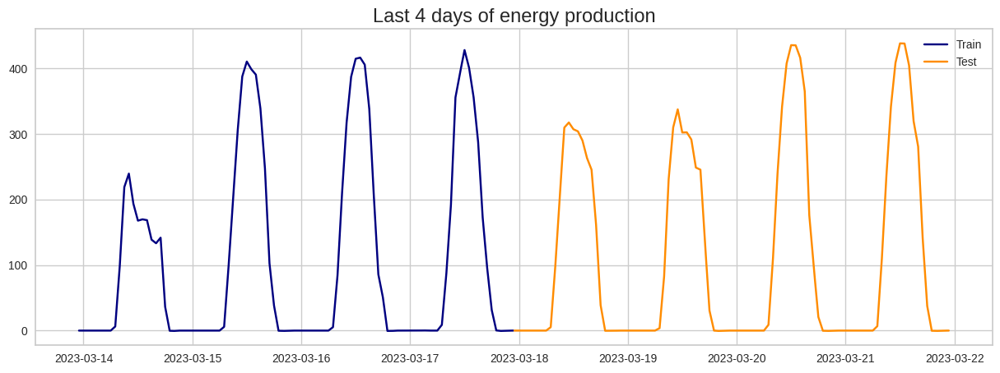

In [27]:
plt.figure(figsize=(15,5))
plt.plot(train_data_arima[arima_steps:]['y'],label='Train',color='navy')
plt.plot(test_data_arima['y'],label='Test',color='darkorange')
plt.title('Last 4 days of energy production',fontsize=17)
plt.legend()
plt.show()

Lo primero es encontrar los valores de los 3 parámetros del modelo Arima:
- p: el número de términos auto regresivos
- d: el número de diferencias no estacionarias
- q: el número de errores de predicción lagged en la ecuación de predicción

Empezamos por descubrir si nuestra serie temporal es estacionaria. Si es así, el valor de d es cero, en caso contrario buscaremos su valor.

In [28]:
result = adfuller(train_data_arima['y'])
print('Augmented Dickey-Fuller Test:')
labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']

for value,label in zip(result,labels):
    print(label+' : '+str(value) )
    
if result[1] <= 0.05:
    print("strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary")
else:
    print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")

Augmented Dickey-Fuller Test:
ADF Test Statistic : -46.58462599188379
p-value : 0.0
#Lags Used : 60
Number of Observations Used : 60460
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


Vemos por el p-valor que, como es menor a 0.05, la serie temporal es efectivamente estacionaria

Continuamos calculando el valor de p. Para ello, mostramos la gráfica de autocorrelación parcial:

La gráfica de la función de autocorrelación parcial se puede utilizar para establecer una correlación entre la serie temporal y su retardo, mientras que se puede ignorar la contribución de los retardos intermedios. Esta trama nos permitirá conocer los retardos que no son necesarios en la parte de autorregresión.

La correlación significativa en una serie temporal estacionaria se puede representar mediante la adición de términos de autorregresión. Utilizando la trama de la PACF, podemos tomar el orden de los términos de AR para que sea igual a los retardos que pueden superar un límite de significancia.

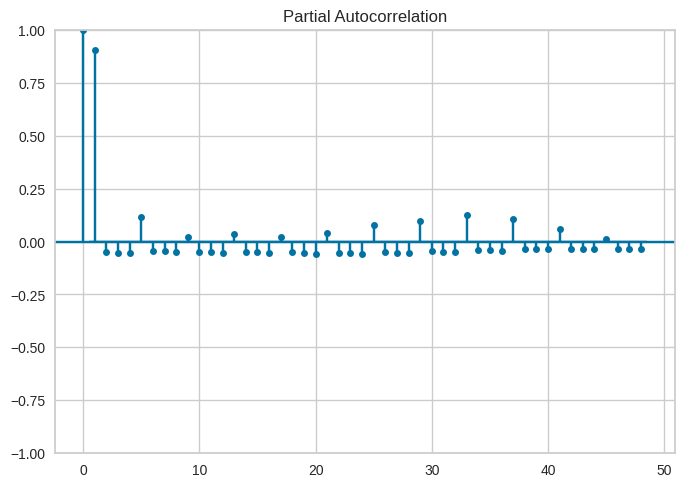

In [29]:
plot_pacf(train_data_arima['y'].diff().dropna())
print('')

Vemos que los lags 1 y 2 estan muy alejados del resto. Escogemos el orden de p como el mayor valor, en este caso 2.

Finalmente, calculamos el valor de la q. Para hallarlo, mostramos la gráfica de autocorrelación

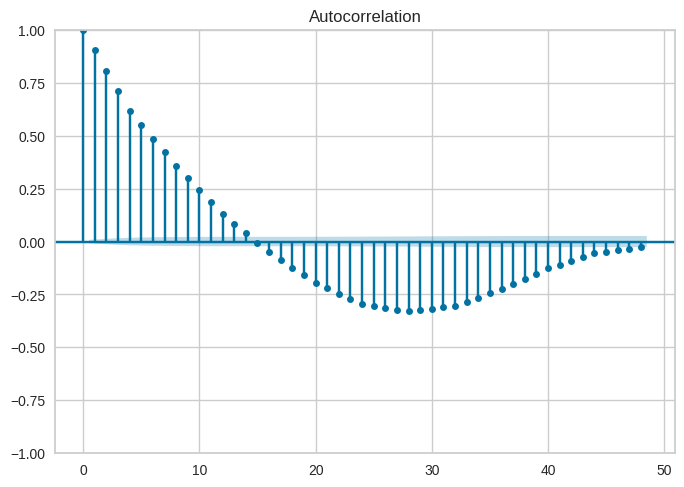

In [30]:
plot_acf(train_data_arima['y'].diff().dropna())
print('')

Cogemos el valor 1 porque es la mayor diferencia significativa.

In [31]:
arima_model = ARIMA(train_data_arima, order=(2,0,1))
arima_model_fit = arima_model.fit()
print(arima_model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                60521
Model:                 ARIMA(2, 0, 1)   Log Likelihood             -189327.778
Date:                Thu, 04 May 2023   AIC                         378665.556
Time:                        09:06:50   BIC                         378710.610
Sample:                    06-25-2021   HQIC                        378679.545
                         - 03-17-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         97.6445      3.302     29.574      0.000      91.173     104.116
ar.L1          1.8984      0.001   1297.506      0.000       1.896       1.901
ar.L2         -0.9076      0.001   -647.660      0.0

In [32]:
arima_forecast = arima_model_fit.forecast(steps=-arima_steps)
print(arima_forecast)

2023-03-17 23:00:00     0.892491
2023-03-17 23:15:00     2.590021
2023-03-17 23:30:00     5.002605
2023-03-17 23:45:00     8.042013
2023-03-18 00:00:00    11.622423
                         ...    
2023-03-21 21:45:00    97.644501
2023-03-21 22:00:00    97.644501
2023-03-21 22:15:00    97.644501
2023-03-21 22:30:00    97.644501
2023-03-21 22:45:00    97.644501
Freq: 15T, Name: predicted_mean, Length: 384, dtype: float64


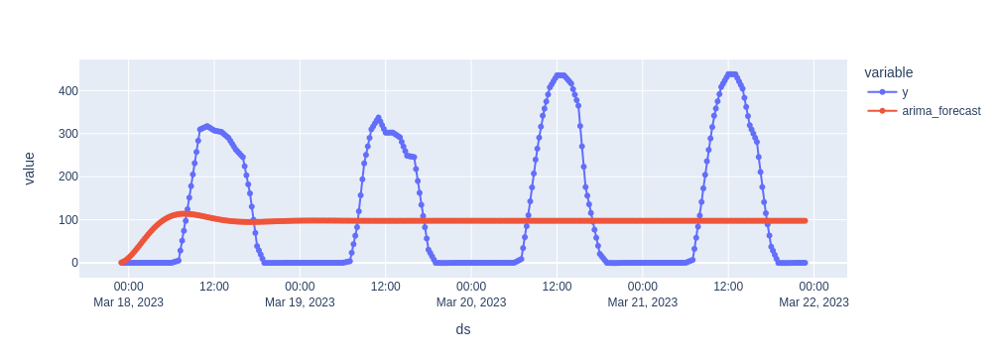

In [33]:
# almacenamos la preddición para compararla con el resto
results['arima'] = arima_forecast

# mostramos los resultados
test_data_arima['arima_forecast'] = arima_forecast
fig = px.line(test_data_arima, y=['y', 'arima_forecast'], markers=True)
fig.show()

#evaluate(predicted=results['arima'], actual=results['y'])

Se observa que para las primeras predicciones al menos almacena la tendencia, pero para el resto se mantiene plana

## SARIMAX

### Usamos Grid-Search para hiper parametrizar el Sarimax

In [34]:
"""
p = d = q = range(0, 3)
pdq = list(itertools.product(p, d, q))

pdqs = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

#sarimax_gridsearch(ts, pdq, pdqs, freq='15T')
"""

"\np = d = q = range(0, 3)\npdq = list(itertools.product(p, d, q))\n\npdqs = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]\n\n#sarimax_gridsearch(ts, pdq, pdqs, freq='15T')\n"

### Resultados de Sarimax con los mejores parámetros

In [35]:
"""
sarimax_model = SARIMAX(endog=train_data_sarimax['y'], 
                        exog=train_data_sarimax[relevantColumns],
                        order = (2, 0, 1), seasonal_order = (2, 0, 1, 24),
                        time_varying_regression=True, mle_regression=False,
                        enforce_stationarity=False,
                        enforce_invertibility = False)

sarimax_model_fit = sarimax_model.fit()
sarimax_model_fit.save('sarimax_model_setpoints.pkl')
"""

"\nsarimax_model = SARIMAX(endog=train_data_sarimax['y'], \n                        exog=train_data_sarimax[relevantColumns],\n                        order = (2, 0, 1), seasonal_order = (2, 0, 1, 24),\n                        time_varying_regression=True, mle_regression=False,\n                        enforce_stationarity=False,\n                        enforce_invertibility = False)\n\nsarimax_model_fit = sarimax_model.fit()\nsarimax_model_fit.save('sarimax_model_setpoints.pkl')\n"

In [36]:
with open('sarimax_model.pkl', 'rb') as f:
    sarimax_model_fit = pickle.load(f)
    sarimax_forecast = sarimax_model_fit.forecast(exog=test_data_sarimax[list(filter(lambda x: x != 'setpoints', relevantColumns))], steps=-sarimax_steps)
    test_data_sarimax['sarimax_forecast'] = sarimax_forecast

In [37]:
with open('sarimax_model_setpoints.pkl', 'rb') as f:
    sarimax_model_fit_setpoints = pickle.load(f)
    sarimax_forecast = sarimax_model_fit_setpoints.forecast(exog=test_data_sarimax[relevantColumns], steps=-sarimax_steps)
    test_data_sarimax['sarimax_forecast_setpoints'] = sarimax_forecast

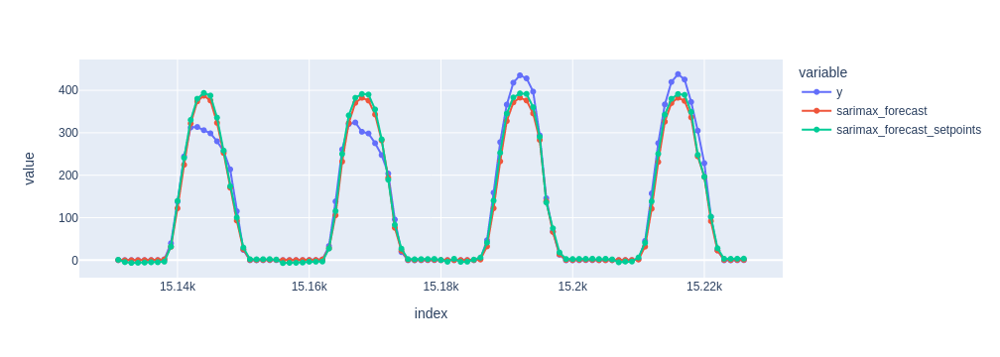

Modelo base:

Average Error: 16.6950 degrees.
SMAPE: 100.8212

Modelo con consignas:

Average Error: 16.3988 degrees.
SMAPE: 104.0781


In [38]:
fig = px.line(test_data_sarimax, y=['y', 'sarimax_forecast', 'sarimax_forecast_setpoints'], markers=True)
fig.show()

print('Modelo base:\n')
evaluate(predicted=test_data_sarimax['sarimax_forecast'], actual=test_data_sarimax['y'])
print('\nModelo con consignas:\n')
evaluate(predicted=test_data_sarimax['sarimax_forecast_setpoints'], actual=test_data_sarimax['y'])

El mejor modelo parece ser 

## Random Forest forecasting

### Usando Grid Search para hiperparametrizar el RF

In [39]:
# Create the parameter grid based on the results of random search 
"""
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
"""

"\nparam_grid = {\n    'bootstrap': [True],\n    'max_depth': [80, 90, 100, 110],\n    'max_features': [2, 3],\n    'min_samples_leaf': [3, 4, 5],\n    'min_samples_split': [8, 10, 12],\n    'n_estimators': [100, 200, 300, 1000]\n}\n"

In [40]:
# Perform the Grid Search
"""
rf = RandomForestRegressor()
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)

# Fit the grid search to the data
grid_search.fit(trainX, trainY)
"""

'\nrf = RandomForestRegressor()\ngrid_search = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)\n\n# Fit the grid search to the data\ngrid_search.fit(trainX, trainY)\n'

In [41]:
"""
best_grid = grid_search.best_estimator_
print(grid_search.best_params_)
grid_accuracy = evaluate(best_grid, testX, testY)

rf_forecast = best_grid.predict(testX)
"""

'\nbest_grid = grid_search.best_estimator_\nprint(grid_search.best_params_)\ngrid_accuracy = evaluate(best_grid, testX, testY)\n\nrf_forecast = best_grid.predict(testX)\n'

### Usando Busqueda Aleatoria para hiperparametrizar el RF

In [42]:
"""
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
"""  

"\n# Number of trees in random forest\nn_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]\n# Number of features to consider at every split\nmax_features = ['auto', 'sqrt']\n# Maximum number of levels in tree\nmax_depth = [int(x) for x in np.linspace(10, 110, num = 11)]\nmax_depth.append(None)\n# Minimum number of samples required to split a node\nmin_samples_split = [2, 5, 10]\n# Minimum number of samples required at each leaf node\nmin_samples_leaf = [1, 2, 4]\n# Method of selecting samples for training each tree\nbootstrap = [True, False]# Create the random grid\nrandom_grid = {'n_estimators': n_estimators,\n               'max_features': max_features,\n               'max_depth': max_depth,\n               'min_samples_split': min_samples_split,\n               'min_samples_leaf': min_samples_leaf,\n               'bootstrap': bootstrap}\n"

In [43]:
"""
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)# Fit the random search model
rf_random.fit(trainX, trainY)
"""

'\n# Use the random grid to search for best hyperparameters\n# First create the base model to tune\nrf = RandomForestRegressor()\n\n# Random search of parameters, using 3 fold cross validation, \n# search across 100 different combinations, and use all available cores\nrf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)# Fit the random search model\nrf_random.fit(trainX, trainY)\n'

In [44]:
"""
best_random = rf_random.best_estimator_
random_accuracy = evaluate(best_random, testX, testY)

forecast = best_random.predict(testX)

#visualize results
test_data_rf['forecast'] = forecast
fig = px.line(test_data_rf, x='ds', y=['y', 'forecast'], markers=True)
fig.show()
"""

"\nbest_random = rf_random.best_estimator_\nrandom_accuracy = evaluate(best_random, testX, testY)\n\nforecast = best_random.predict(testX)\n\n#visualize results\ntest_data_rf['forecast'] = forecast\nfig = px.line(test_data_rf, x='ds', y=['y', 'forecast'], markers=True)\nfig.show()\n"

### Resultados usando el mejor Random Forest

Probamos con las variables radiacion solar, mes y hora

In [45]:
rf = RandomForestRegressor(bootstrap=True, max_depth=80, max_features=2, min_samples_leaf= 5, min_samples_split=12, n_estimators= 200)
rf_fitted = rf.fit(trainX.iloc[:, trainX.columns!='setpoints'], trainY)
rf_forecast = rf_fitted.predict(testX.iloc[:, testX.columns!='setpoints'])
results['rf'] = rf_forecast

Añadimos la variable de las consignas

In [46]:
# Una vez ejecutado, se vio que los mejores parámetros eran {'bootstrap': True, 'max_depth': 80, 'max_features': 2, 'min_samples_leaf': 5, 'min_samples_split': 12, 'n_estimators': 200}
rf_setpoints = RandomForestRegressor(bootstrap=True, max_depth=80, max_features=2, min_samples_leaf= 5, min_samples_split=12, n_estimators= 200)
rf_setpoints_fitted = rf_setpoints.fit(trainX, trainY)
rf_setpoints_forecast = rf_setpoints_fitted.predict(testX)
results['rf_setpoints'] = rf_setpoints_forecast

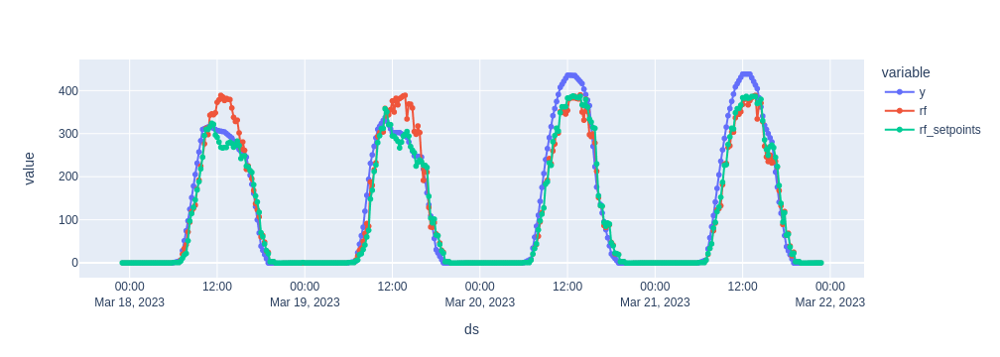

Modelo base
Average Error: 22.6911 degrees.
SMAPE: 97.9044

Modelo con consignas
Average Error: 17.7131 degrees.
SMAPE: 97.0405


In [47]:
# Visualize results
fig = px.line(results, y=['y', 'rf', 'rf_setpoints'], markers=True)
fig.show()

print('Modelo base')
evaluate(predicted=results['rf'], actual=results['y'])

print('\nModelo con consignas')
evaluate(predicted=results['rf_setpoints'], actual=results['y'])

## Prophet forecasting

In [48]:
# Creamos un modelo y lo ajustamos a nuestros datos de entrenamiento en el formato de columnas [ds, y]
"""
prophet_model = Prophet(yearly_seasonality=True, daily_seasonality=True)
prophet_model.fit(train_data_prophet)

with open('prophet_model.json', 'w') as fout:
    fout.write(model_to_json(prophet_model))  # Save model
"""

"\nprophet_model = Prophet(yearly_seasonality=True, daily_seasonality=True)\nprophet_model.fit(train_data_prophet)\n\nwith open('prophet_model.json', 'w') as fout:\n    fout.write(model_to_json(prophet_model))  # Save model\n"

In [49]:
with open('prophet_model.json', 'r') as fin:
    prophet_model = model_from_json(fin.read())  # Load model

In [50]:
future_dates = pd.DataFrame()
future_dates['ds'] = test_data_prophet['ds']

# Una vez entrenado, predecimos los valores de y dadas las fechas del dataframe de testeo, (futuro)
prophet_forecast = prophet_model.predict(future_dates)

prophet_forecast.set_index('ds', inplace=True)

results['prophet'] = prophet_forecast['yhat']
results['prophet_clipped'] = prophet_forecast['yhat'].clip(0)

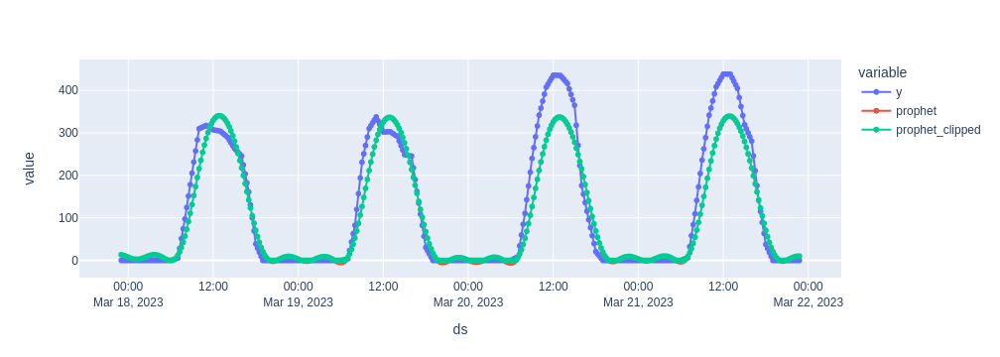

Base results:

Average Error: 29.8268 degrees.
SMAPE: 111.7634

Clipped results:

Average Error: 29.4956 degrees.
SMAPE: 98.7919


In [51]:
fig = px.line(results, y=['y', 'prophet', 'prophet_clipped'], markers=True)
fig.show()

print('Base results:\n')
evaluate(predicted=results['prophet'], actual=results['y'])

print('\nClipped results:\n')
evaluate(predicted=results['prophet_clipped'], actual=results['y'])

## NeuralProphet

### Modelo Univariable

#### Código

In [52]:
"""
model = NeuralProphet(
    n_lags= -neural_steps*2,rics evaluation and plotting.

Parameters:
    n_forecasts=-neural_steps,
    weekly_seasonality=False,
    daily_seasonality=True,
    yearly_seasonality=True,
    seasonality_mode="additive")

# dividimos el conjunto de entrenamiento en dos subconjuntos para que el modelo se autoevalue
df_train, df_test = model.split_df(train_data_neural, freq="15T")

# entrenamos el modelo
metrics = model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")
save(model, "neural_uni_model.np")
"""

'\nmodel = NeuralProphet(\n    n_lags= -neural_steps*2,rics evaluation and plotting.\n\nParameters:\n    n_forecasts=-neural_steps,\n    weekly_seasonality=False,\n    daily_seasonality=True,\n    yearly_seasonality=True,\n    seasonality_mode="additive")\n\n# dividimos el conjunto de entrenamiento en dos subconjuntos para que el modelo se autoevalue\ndf_train, df_test = model.split_df(train_data_neural, freq="15T")\n\n# entrenamos el modelo\nmetrics = model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")\nsave(model, "neural_uni_model.np")\n'

In [53]:
model = load("neural_uni_model.np")

future = model.make_future_dataframe(train_data_neural, periods=-neural_steps)
neural_forecast = model.predict(future)

INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.998% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.998% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.653% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.653% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.653% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.653% of the data.
INFO - (NP.df_utils._infer_frequen

Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column


#### Gŕafica

In [54]:
forecast_uni = to_yhat1_along(model, neural_forecast)
forecast_uni.reset_index(inplace=True)

results_neural['uni'] = forecast_uni['yhat1']

results_neural['uni_clipped'] = forecast_uni['yhat1'].clip(0)

fig = px.line(results_neural, x='ds', y=['y','uni', 'uni_clipped'], markers=True)
fig.show()

print('Base results:\n')
evaluate(predicted=results_neural['uni'], actual=results_neural['y'])

print('\nClipped results:\n')
evaluate(predicted=results_neural['uni_clipped'], actual=results_neural['y'])

Base results:

Average Error: 35.9828 degrees.
SMAPE: 115.4600

Clipped results:

Average Error: 27.2223 degrees.
SMAPE: 47.3863


### Modelo multivariable con regresores lag

#### Código

In [55]:
"""
complex_model = NeuralProphet(
    n_forecasts=-neural_steps,
    n_lags=-neural_steps*2,
    weekly_seasonality=False,
    daily_seasonality=True,
    yearly_seasonality=True,
    seasonality_mode="additive"
)

complex_model = complex_model.add_lagged_regressor(names='solar_irradiance')

df_train, df_test = complex_model.split_df(train_data_neural_multi.iloc[:, train_data_neural_multi.columns!='setpoints'], freq="15T")
metrics = complex_model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")
save(complex_model, 'neural_multi_model.np')
"""

'\ncomplex_model = NeuralProphet(\n    n_forecasts=-neural_steps,\n    n_lags=-neural_steps*2,\n    weekly_seasonality=False,\n    daily_seasonality=True,\n    yearly_seasonality=True,\n    seasonality_mode="additive"\n)\n\ncomplex_model = complex_model.add_lagged_regressor(names=\'solar_irradiance\')\n\ndf_train, df_test = complex_model.split_df(train_data_neural_multi.iloc[:, train_data_neural_multi.columns!=\'setpoints\'], freq="15T")\nmetrics = complex_model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")\nsave(complex_model, \'neural_multi_model.np\')\n'

In [56]:
"""
complex_model = NeuralProphet(
    n_forecasts=-neural_steps,
    n_lags=-neural_steps*2,
    weekly_seasonality=False,
    daily_seasonality=True,
    yearly_seasonality=True,
    seasonality_mode="additive"
)

complex_model = complex_model.add_lagged_regressor(names=neural_relevantColumns)

df_train, df_test = complex_model.split_df(train_data_neural_multi, freq="15T")
metrics = complex_model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")
save(complex_model, 'neural_multi_model_setpoints.np')
"""

'\ncomplex_model = NeuralProphet(\n    n_forecasts=-neural_steps,\n    n_lags=-neural_steps*2,\n    weekly_seasonality=False,\n    daily_seasonality=True,\n    yearly_seasonality=True,\n    seasonality_mode="additive"\n)\n\ncomplex_model = complex_model.add_lagged_regressor(names=neural_relevantColumns)\n\ndf_train, df_test = complex_model.split_df(train_data_neural_multi, freq="15T")\nmetrics = complex_model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")\nsave(complex_model, \'neural_multi_model_setpoints.np\')\n'

In [57]:
complex_model = load('neural_multi_model.np')
complex_model_setpoints = load('neural_multi_model_setpoints.np')

In [58]:
future = complex_model.make_future_dataframe(train_data_neural_multi.iloc[:, train_data_neural_multi.columns!='setpoints'], periods=-neural_steps)

neural_forecast = complex_model.predict(future)

forecast_multi = to_yhat1_along(complex_model, neural_forecast)
forecast_multi.reset_index(inplace=True)

results_neural['multi'] = forecast_multi['yhat1']

INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.998% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.998% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.653% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.653% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.653% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.653% of the data.
INFO - (NP.df_utils._infer_frequen

Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column


In [59]:
future = complex_model_setpoints.make_future_dataframe(train_data_neural_multi, periods=-neural_steps)

neural_forecast_setpoints = complex_model_setpoints.predict(future)

forecast_multi = to_yhat1_along(complex_model_setpoints, neural_forecast_setpoints)
forecast_multi.reset_index(inplace=True)

results_neural['multi_setpoints'] = forecast_multi['yhat1']

INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.998% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.998% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.653% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.653% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.653% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.653% of the data.
INFO - (NP.df_utils._infer_frequen

Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column


#### Gŕafico

In [60]:
fig = px.line(results_neural, x='ds', y=['y','multi', 'multi_setpoints'], markers=True)
fig.show()

print('Modelo base')
evaluate(predicted=results_neural['multi'], actual=results_neural['y'])

print('\nModelo con consignas')
evaluate(predicted=results_neural['multi_setpoints'], actual=results_neural['y'])

Modelo base
Average Error: 25.8255 degrees.
SMAPE: 109.2601

Modelo con consignas
Average Error: 30.5460 degrees.
SMAPE: 107.4054


### Modelo Multivariable con regresores futuros

#### Código

In [61]:
"""
future_model = NeuralProphet(
    n_forecasts=-neural_steps,
    n_lags=-neural_steps,
    weekly_seasonality=False,
    daily_seasonality=True,
    yearly_seasonality=True,
    seasonality_mode="additive"
)

future_model = future_model.add_future_regressor(name='solar_irradiance')

df_train, df_test = future_model.split_df(train_data_neural_multi.iloc[:, train_data_neural_multi.columns!='setpoints'], freq="15T")
metrics = future_model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")
save(future_model, 'neural_future_multi_model.np')
"""

'\nfuture_model = NeuralProphet(\n    n_forecasts=-neural_steps,\n    n_lags=-neural_steps,\n    weekly_seasonality=False,\n    daily_seasonality=True,\n    yearly_seasonality=True,\n    seasonality_mode="additive"\n)\n\nfuture_model = future_model.add_future_regressor(name=\'solar_irradiance\')\n\ndf_train, df_test = future_model.split_df(train_data_neural_multi.iloc[:, train_data_neural_multi.columns!=\'setpoints\'], freq="15T")\nmetrics = future_model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")\nsave(future_model, \'neural_future_multi_model.np\')\n'

In [62]:
""""
future_model = NeuralProphet(
    n_forecasts=-neural_steps,
    n_lags=-neural_steps,
    weekly_seasonality=False,
    daily_seasonality=True,
    yearly_seasonality=True,
    seasonality_mode="additive"
)

future_model = future_model.add_future_regressor(name='solar_irradiance')

future_model = future_model.add_future_regressor(name='setpoints')


df_train, df_test = future_model.split_df(train_data_neural_multi, freq="15T")
metrics = future_model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")
save(future_model, 'neural_future_multi_model_setpoints.np')
"""

'"\nfuture_model = NeuralProphet(\n    n_forecasts=-neural_steps,\n    n_lags=-neural_steps,\n    weekly_seasonality=False,\n    daily_seasonality=True,\n    yearly_seasonality=True,\n    seasonality_mode="additive"\n)\n\nfuture_model = future_model.add_future_regressor(name=\'solar_irradiance\')\n\nfuture_model = future_model.add_future_regressor(name=\'setpoints\')\n\n\ndf_train, df_test = future_model.split_df(train_data_neural_multi, freq="15T")\nmetrics = future_model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")\nsave(future_model, \'neural_future_multi_model_setpoints.np\')\n'

In [63]:
future_model = load('neural_future_multi_model.np')
future_model_setpoints = load('neural_future_multi_model_setpoints.np')

In [64]:
dfFut = test_data_neural_multi[['y', 'ds', 'solar_irradiance']]
dfFut['y'] = None

dfFuture = pd.concat([train_data_neural_multi.iloc[neural_steps:, train_data_neural_multi.columns!='setpoints'], dfFut])

future_forecast = future_model.predict(dfFuture)

future_forecast = to_yhat1_along(future_model, future_forecast)
future_forecast.reset_index(inplace=True)

results_neural['future_multi'] = future_forecast['yhat1']

INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column


In [65]:
dfFut = test_data_neural_multi[['y', 'ds', 'solar_irradiance', 'setpoints']]
dfFut['y'] = None
dfFuture = pd.concat([train_data_neural_multi[neural_steps:], dfFut])

future_forecast_setpoints = future_model_setpoints.predict(dfFuture)

future_forecast_setpoints = to_yhat1_along(future_model_setpoints, future_forecast_setpoints)
future_forecast_setpoints.reset_index(inplace=True)

results_neural['future_multi_setpoints'] = future_forecast_setpoints['yhat1']

INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column


#### Gráfico

In [66]:
fig = px.line(results_neural, x='ds', y=['y','future_multi', 'future_multi_setpoints'], markers=True)
fig.show()

print('Modelo base')
evaluate(predicted=results_neural['future_multi'], actual=results_neural['y'])

print('\nModelo con consignas')
evaluate(predicted=results_neural['future_multi_setpoints'], actual=results_neural['y'])

Modelo base
Average Error: 28.8426 degrees.
SMAPE: 115.3556

Modelo con consignas
Average Error: 22.0990 degrees.
SMAPE: 104.4182


## PyCaret
- https://www.kaggle.com/code/ngupta23/multiple-time-series-modeling-with-pycaret
- https://github.com/pycaret/pycaret-demo-mlflow/blob/main/Demo%203%20-%20Multiple%20Time%20Series%20with%20Logging.ipynb

### Best pycaret model

#### Código

In [67]:
#train, test = train_test_split(train_data_pycaret, test_size=0.2, shuffle=False)

In [68]:
setup(data = train_data_pycaret, 
          train_size = 0.8,
          fold = 3,
          #test_data = test,
          data_split_shuffle = False,
          target = 'y', 
          fold_strategy = 'timeseries', 
          numeric_features = ['solar_irradiance', 'setpoints'], 
          #ignore_features = ['setpoints'],
          #transform_target = False, 
          verbose = False,
          session_id = 123)

In [69]:
best = compare_models(sort = 'MAE')
final_best = finalize_model(best)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,16.7739,1135.4765,33.5151,0.9370,0.6878,1.4188,0.0333
lightgbm,Light Gradient Boosting Machine,16.7953,1124.8744,33.3667,0.9375,0.6664,1.3056,0.0433
knn,K Neighbors Regressor,17.7635,1240.7693,35.0349,0.9311,0.7216,1.3717,0.3300
rf,Random Forest Regressor,18.9736,1445.3960,37.8505,0.9196,0.6785,1.3215,0.3133
huber,Huber Regressor,19.7904,1728.8395,40.7946,0.9053,0.8074,1.9736,0.0300
et,Extra Trees Regressor,19.8643,1591.2541,39.7260,0.9114,0.6882,1.3751,0.4833
ada,AdaBoost Regressor,21.1272,1598.8865,39.5294,0.9127,0.7457,1.8934,0.0433
dt,Decision Tree Regressor,21.2943,1877.0498,43.1422,0.8955,0.7217,1.3616,0.0333
omp,Orthogonal Matching Pursuit,22.8786,1691.0663,40.4067,0.9075,1.5619,6.8436,0.0200
llar,Lasso Least Angle Regression,23.7951,1636.0270,39.8700,0.9105,1.6935,7.9381,0.0167


In [70]:
predictions_future = predict_model(final_best, data=test_data_pycaret.iloc[:, test_data_pycaret.columns!='y'])
#df_i = pd.date_range(start='2023-03-17 23:00:00', end='2023-03-21 22:45:00', freq = '15T')
#predictions_future.set_index(df_i, inplace=True)
results['pycaret'] = predictions_future['prediction_label']

#### Gráfico

In [71]:
# Visualize results
fig = px.line(results, y=['y', 'pycaret'], markers=True)
fig.show()

print('\nModelo con consignas')
evaluate(predicted=results['pycaret'], actual=results['y'])


Modelo con consignas
Average Error: 17.2364 degrees.
SMAPE: 112.3945


### Blending the 3 best pycaret models

#### Código

In [72]:
setup(data = train_data_pycaret, 
          train_size = 0.8,
          fold = 3,
          #test_data = test,
          data_split_shuffle = False,
          target = 'y', 
          fold_strategy = 'timeseries', 
          numeric_features = ['solar_irradiance', 'setpoints'], 
          #ignore_features = ['setpoints'],
          #transform_target = False, 
          verbose = False,
          session_id = 123)

In [73]:
best_baseline_models = compare_models(n_select=3)#, sort='MAE')
best_tuned_models = [tune_model(model, choose_better = True) for model in best_baseline_models]
blender = blend_models(best_tuned_models)
final_best = finalize_model(blender)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,16.7953,1124.8744,33.3667,0.9375,0.6664,1.3056,0.0367
gbr,Gradient Boosting Regressor,16.7739,1135.4765,33.5151,0.9370,0.6878,1.4188,0.0433
knn,K Neighbors Regressor,17.7635,1240.7693,35.0349,0.9311,0.7216,1.3717,0.3033
rf,Random Forest Regressor,18.9736,1445.3960,37.8505,0.9196,0.6785,1.3215,0.1167
ada,AdaBoost Regressor,21.1272,1598.8865,39.5294,0.9127,0.7457,1.8934,0.0433
et,Extra Trees Regressor,19.8643,1591.2541,39.7260,0.9114,0.6882,1.3751,0.2033
en,Elastic Net,23.7962,1635.9978,39.8697,0.9105,1.6936,7.9392,0.0367
br,Bayesian Ridge,23.7971,1635.9616,39.8694,0.9105,1.6937,7.9399,0.0200
llar,Lasso Least Angle Regression,23.7951,1636.0270,39.8700,0.9105,1.6935,7.9381,0.0200
lar,Least Angle Regression,23.7971,1635.9636,39.8694,0.9105,1.6937,7.9397,0.0200


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,13.7062,842.9240,29.0332,0.9387,0.6255,1.7332
1,18.6404,1145.5749,33.8463,0.9400,0.7260,1.8122
2,18.3037,1405.4851,37.4898,0.9330,0.7810,1.2423
Mean,16.8834,1131.3280,33.4564,0.9372,0.7108,1.5959
Std,2.2508,229.8854,3.4634,0.0030,0.0644,0.2521


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,14.2509,902.1535,30.0359,0.9344,0.6197,1.6952
1,19.0979,1314.0800,36.2502,0.9311,0.6181,1.1041
2,18.5642,1450.9437,38.0913,0.9308,0.7647,1.1260
Mean,17.3043,1222.3924,34.7925,0.9321,0.6675,1.3084
Std,2.1700,233.2347,3.4464,0.0016,0.0687,0.2736


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,13.6331,845.5425,29.0782,0.9385,0.5868,1.5393
1,18.4697,1129.3188,33.6053,0.9408,0.6698,1.5360
2,18.3055,1421.7709,37.7064,0.9322,0.7777,1.0969
Mean,16.8028,1132.2107,33.4633,0.9372,0.6781,1.3907
Std,2.2423,235.2531,3.5239,0.0036,0.0781,0.2078


Fitting 3 folds for each of 10 candidates, totalling 30 fits


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,13.6871,843.8724,29.0495,0.9387,0.6129,1.6828
1,18.0964,1087.4983,32.9772,0.9430,0.6448,1.2828
2,18.2388,1409.1087,37.5381,0.9328,0.7670,1.1299
Mean,16.6741,1113.4931,33.1883,0.9382,0.6749,1.3652
Std,2.1129,231.4876,3.4687,0.0042,0.0664,0.2331


In [74]:
predictions_future = predict_model(final_best, data=test_data_pycaret.iloc[:, test_data_pycaret.columns!='y'])
results['pycaret_blended'] = predictions_future['prediction_label']

#### Gráfico

In [75]:
fig = px.line(results, y=['y', 'pycaret', 'pycaret_blended'], markers=True)
fig.show()

print('Modelo con consignas')
evaluate(predicted=results['pycaret'], actual=results['y'])

print('\n 3 mejores modelos con consignas')
evaluate(predicted=results['pycaret_blended'], actual=results['y'])

Modelo con consignas
Average Error: 17.2364 degrees.
SMAPE: 112.3945

 3 mejores modelos con consignas
Average Error: 17.3456 degrees.
SMAPE: 113.6654


## Entrenando los mejores modelos hasta la fecha en la que se empiezan a usar predicciones de los regresores

### Conjuntos de entrenamiento y validacion

In [76]:
predicted = dfFutureIter.copy(deep=True)
test = dfFutureIter.reset_index()
test = add_datetime_features(test)
test.drop(columns = 'solar_irradiance',inplace=True)
test.rename(columns={'f_solar_irradiance': 'solar_irradiance'}, inplace=True)
first_date = test.iloc[0]['ds']
last_date = test.iloc[-1]['ds']
print(first_date)
print(last_date)

2023-02-01 00:00:00
2023-03-01 00:00:00


In [77]:
train = df.copy(deep=True)
train.reset_index(inplace=True)
train = add_datetime_features(train)
mask = (train['ds'] >= first_date) & (train['ds'] <= last_date)

historic_test = train.loc[mask].copy(deep=True)
results = train.loc[mask].copy(deep=True)

night_hours = results.loc[(results['altitude'] < 0)]
night_hours = night_hours.ds

setpoints_hours = results.loc[(results['setpoints'] < 500)]
setpoints_hours = setpoints_hours.ds

#results.reset_index(inplace=True)
results = results[['ds', 'y', 'setpoints', 'solar_irradiance', 'altitude']]
results['solar_irradiance'] =  results['solar_irradiance'] / 3
results['f_solar_irradiance'] = predicted['f_solar_irradiance'].astype('float64').array / 3
results.set_index('ds', inplace=True)

pred = predicted['f_energy_15m_np'].astype('float64').array[4:] #adelantamos las prediccciones del iter 1 hora 
results['y_Iter_np'] = 0
results.loc[:len(pred), 'y_Iter_np'] = pred
results['y_Iter_np'] = results['y_Iter_np'].interpolate()

pred = predicted['f_energy_15m'].astype('float64').array[4:]
results['y_Iter'] = 0
results.loc[:len(pred),'y_Iter'] =  pred
results['y_Iter'] = results['y_Iter'].interpolate()


mask = (train['ds'] < first_date)
train = train.loc[mask]
train.tail()

,ds,y,wind_speed,wind_dir_sin,wind_dir_cos,solar_irradiance,temp,pressure,humidity,setpoints,altitude,ts,Lag_1,minute,hour,day,week,month,year
56200,2023-01-31 22:45:00,-0.0,4.656250,0.356575,0.934267,0.0,14.173864,1018.380,61.376136,500.0,-54.545373,56201,-0.0,45,22,31,5,1,2023
56201,2023-01-31 23:00:00,-0.0,4.825889,0.277650,0.960682,0.0,13.926667,1018.345,60.541111,500.0,-57.793193,56202,-0.0,0,23,31,5,1,2023
56202,2023-01-31 23:15:00,-0.0,3.612444,0.553101,0.833114,0.0,13.942222,1018.300,62.471111,500.0,-61.005069,56203,-0.0,15,23,31,5,1,2023
56203,2023-01-31 23:30:00,-0.0,3.426180,0.427042,0.904232,0.0,14.052809,1018.360,62.674157,500.0,-64.164716,56204,-0.0,30,23,31,5,1,2023
56204,2023-01-31 23:45:00,-0.0,4.371889,0.624016,0.781412,0.0,14.142222,1018.410,61.970000,500.0,-67.247502,56205,-0.0,45,23,31,5,1,2023


In [78]:
results.tail()

,y,setpoints,solar_irradiance,altitude,f_solar_irradiance,y_Iter_np,y_Iter
ds,,,,,,,
2023-02-28 23:00:00,-0.0,500.0,0.0,-53.056370,0.0,0.0,0.0
2023-02-28 23:15:00,-0.0,500.0,0.0,-55.957740,0.0,0.0,0.0
2023-02-28 23:30:00,-0.0,500.0,0.0,-58.732055,0.0,0.0,0.0
2023-02-28 23:45:00,-0.0,500.0,0.0,-61.340847,0.0,0.0,0.0
2023-03-01 00:00:00,-0.0,500.0,0.0,-63.733323,0.0,0.0,0.0


### Evaluando las predicciones del Iter

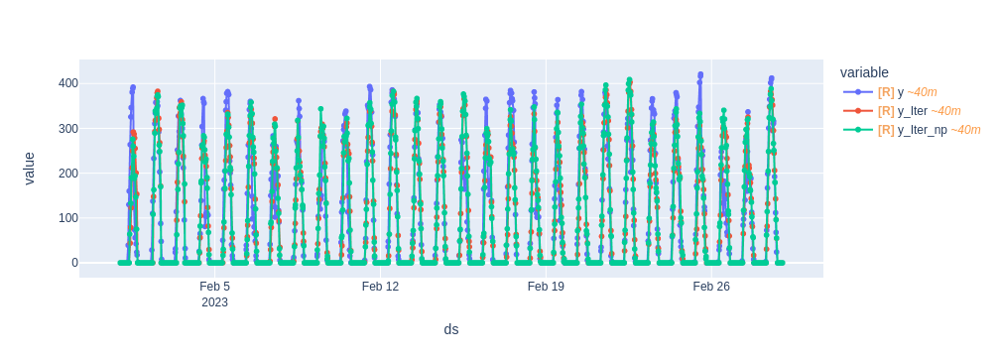

Modelo Prophet comparando consignas
Average Error: 26.2282 degrees.
SMAPE: 58.5360

 Modelo Prophet sin consignas
Average Error: 25.3059 degrees.
SMAPE: 59.3370


Modelo Neural Prophet comparando consignas
Average Error: 23.3541 degrees.
SMAPE: 55.1763

Modelo Neural Prophet sin consignas
Average Error: 22.3695 degrees.
SMAPE: 55.9073


In [79]:
# Visualize results
fig = px.line(results, y=['y', 'y_Iter', 'y_Iter_np'], markers=True)
fig.show()

print('Modelo Prophet comparando consignas')
evaluate(predicted=results['y_Iter'], actual=results['y'])
print('\n Modelo Prophet sin consignas')
evaluate(predicted=results['y_Iter'].loc[~results.index.isin(setpoints_hours)], actual=results['y'].loc[~results.index.isin(setpoints_hours)])

print('\n\nModelo Neural Prophet comparando consignas')
evaluate(predicted=results['y_Iter_np'], actual=results['y'])
print('\nModelo Neural Prophet sin consignas')
evaluate(predicted=results['y_Iter_np'].loc[~results.index.isin(setpoints_hours)], actual=results['y'].loc[~results.index.isin(setpoints_hours)])

### Random forest con consignas

#### Código

In [80]:
"""
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
"""

"\nparam_grid = {\n    'bootstrap': [True],\n    'max_depth': [80, 90, 100, 110],\n    'max_features': [2, 3],\n    'min_samples_leaf': [3, 4, 5],\n    'min_samples_split': [8, 10, 12],\n    'n_estimators': [100, 200, 300, 1000]\n}\n"

In [81]:
relevant_columns = ['solar_irradiance', 'month', 'hour', 'setpoints']
#neural_relevantColumns = ['solar_irradiance', 'setpoints']

In [82]:
trainX, trainY = train.loc[:, relevant_columns], train['y']
testX, testY = test.loc[:, relevant_columns], test['y']

In [83]:
"""
rf = RandomForestRegressor()
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)

# Fit the grid search to the data
grid_search.fit(trainX, trainY)
"""

'\nrf = RandomForestRegressor()\ngrid_search = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)\n\n# Fit the grid search to the data\ngrid_search.fit(trainX, trainY)\n'

In [84]:
"""
best_grid = grid_search.best_estimator_
print(grid_search.best_params_)

rf_forecast = best_grid.predict(testX)
results['rf_forecast'] = rf_final_forecast
results['rf_forecast'].loc[results.index.isin(night_hours)] = 0
"""

"\nbest_grid = grid_search.best_estimator_\nprint(grid_search.best_params_)\n\nrf_forecast = best_grid.predict(testX)\nresults['rf_forecast'] = rf_final_forecast\nresults['rf_forecast'].loc[results.index.isin(night_hours)] = 0\n"

In [85]:
rf_final = RandomForestRegressor(bootstrap=True, max_depth=110, max_features=2, min_samples_leaf= 5, min_samples_split=8, n_estimators= 100)
rf_final_fitted = rf_final.fit(trainX, trainY)
rf_final_forecast = rf_final_fitted.predict(testX)
results['rf_forecast'] = rf_final_forecast
results['rf_forecast'].loc[results.index.isin(night_hours)] = 0

#### Gráficos

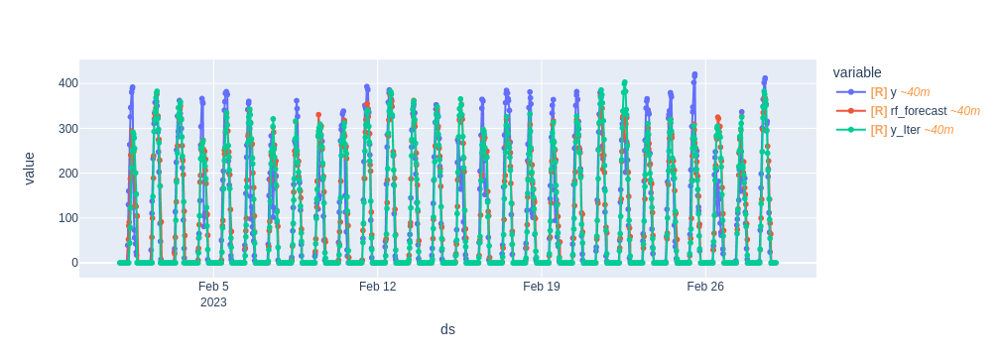

Modelo Random Forest con consignas
Average Error: 28.8736 degrees.
SMAPE: 59.8185

Modelo Random Forest sin consignas
Average Error: 28.6384 degrees.
SMAPE: 60.8373


In [86]:
# Visualize results
fig = px.line(results, y=['y', 'rf_forecast', 'y_Iter'], markers=True)
fig.show()


print('Modelo Random Forest con consignas')
evaluate(predicted=results['rf_forecast'], actual=results['y'])

print('\nModelo Random Forest sin consignas')
evaluate(predicted=results['rf_forecast'].loc[~results.index.isin(setpoints_hours)], actual=results['y'].loc[~results.index.isin(setpoints_hours)])

### Neural Prophet con regresores futuros (radiacion y consignas)

#### Código

In [87]:
neural_columns = ['solar_irradiance', 'setpoints', 'y', 'ds']

In [88]:
"""
steps = 4*24
future_model = NeuralProphet(
    n_forecasts=steps,
    n_lags=steps,
    weekly_seasonality=False,
    daily_seasonality=True,
    yearly_seasonality=True,
    seasonality_mode="additive"
)

future_model = future_model.add_future_regressor(name='solar_irradiance')
future_model = future_model.add_future_regressor(name='setpoints')

df_train, df_test = future_model.split_df(train.loc[:, neural_columns], freq="15T")
metrics = future_model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")
save(future_model, 'neural_final.np')
"""

'\nsteps = 4*24\nfuture_model = NeuralProphet(\n    n_forecasts=steps,\n    n_lags=steps,\n    weekly_seasonality=False,\n    daily_seasonality=True,\n    yearly_seasonality=True,\n    seasonality_mode="additive"\n)\n\nfuture_model = future_model.add_future_regressor(name=\'solar_irradiance\')\nfuture_model = future_model.add_future_regressor(name=\'setpoints\')\n\ndf_train, df_test = future_model.split_df(train.loc[:, neural_columns], freq="15T")\nmetrics = future_model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")\nsave(future_model, \'neural_final.np\')\n'

In [89]:
model = load('neural_final.np')

In [90]:
lags = model.n_lags
actual = pd.concat([train[-lags:], historic_test])
data = future_prediction_validation(model, future_df = test.loc[:, neural_columns], actual_df = actual.loc[:, neural_columns])
results['neural'] = data['prediction'].array
#results['neural'] = results['neural'].clip(0)
results['neural'].loc[results.index.isin(night_hours)] = 0

INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column


#### Gráfico

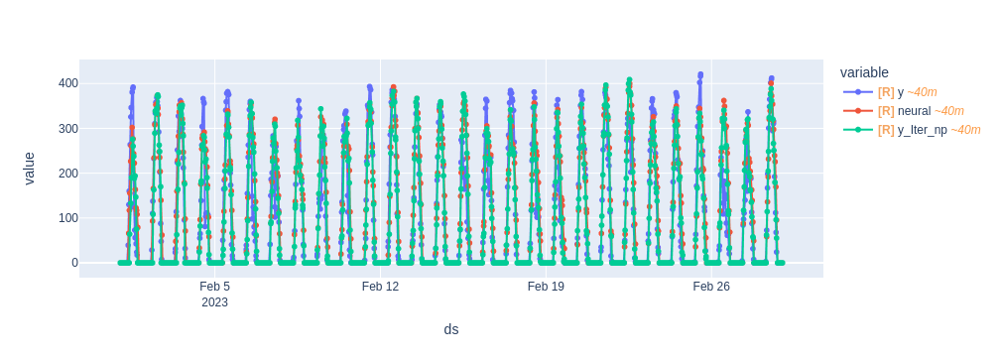

Modelo neural con consignas
Average Error: 25.5651 degrees.
SMAPE: 56.3899

Modelo neural sin consignas
Average Error: 24.6675 degrees.
SMAPE: 57.1385


In [91]:
fig = px.line(results, y = ['y','neural','y_Iter_np'], markers=True)
fig.show()

print('Modelo neural con consignas')
evaluate(predicted=results['neural'], actual=results['y'])

print('\nModelo neural sin consignas')
evaluate(predicted=results['neural'].loc[~results.index.isin(setpoints_hours)], actual=results['y'].loc[~results.index.isin(setpoints_hours)])

### Neural Prophet con regresores futuros y opciones vanilla

#### Código

In [92]:
neural_columns = ['solar_irradiance', 'setpoints', 'y', 'ds']

In [93]:
"""
steps = 4*24
future_model = NeuralProphet(
    n_forecasts=steps,
    n_lags=steps
)

future_model = future_model.add_future_regressor(name='setpoints')
future_model = future_model.add_future_regressor(name='solar_irradiance')

df_train, df_test = future_model.split_df(train.loc[:, neural_columns], freq="15T")
metrics = future_model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")
save(future_model, 'neural_final_vanilla.np')
"""

'\nsteps = 4*24\nfuture_model = NeuralProphet(\n    n_forecasts=steps,\n    n_lags=steps\n)\n\nfuture_model = future_model.add_future_regressor(name=\'setpoints\')\nfuture_model = future_model.add_future_regressor(name=\'solar_irradiance\')\n\ndf_train, df_test = future_model.split_df(train.loc[:, neural_columns], freq="15T")\nmetrics = future_model.fit(df_train, freq="15T", validation_df=df_test, progress="plot")\nsave(future_model, \'neural_final_vanilla.np\')\n'

In [94]:
model = load('neural_final_vanilla.np')

In [95]:
lags = model.n_lags
actual = pd.concat([train[-lags:], historic_test])
data = future_prediction_validation(model, future_df = test.loc[:, neural_columns], actual_df = actual.loc[:, neural_columns])
results['neural_vanilla'] = data['prediction'].array
#results['neural_vanilla'] = results['neural_vanilla'].clip(0)
results['neural_vanilla'].loc[results.index.isin(night_hours)] = 0

INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T
INFO - (NP.df_utils._infer_frequency) - Major frequency 15T corresponds to 99.479% of the data.
NP.df_utils INFO  Major frequency 15T corresponds to 99.479% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 15T
NP.df_utils INFO  Defined frequency is equal to major frequency - 15T


Predicting: 0it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
NP.df_utils INFO  Returning df with no ID column


#### Gráfico

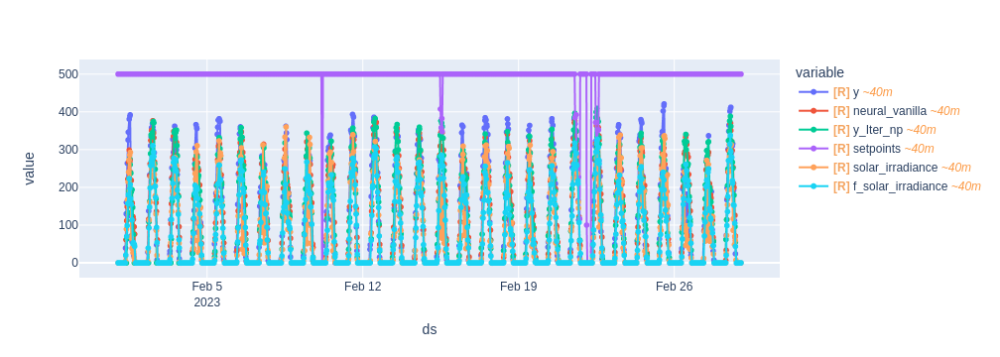

Modelo neural con consignas
Average Error: 25.1111 degrees.
SMAPE: 56.5608

Modelo neural sin consignas
Average Error: 24.4561 degrees.
SMAPE: 57.4136


In [96]:
fig = px.line(results, y = ['y','neural_vanilla','y_Iter_np', 'setpoints', 'solar_irradiance', 'f_solar_irradiance'], markers=True)
fig.show()


print('Modelo neural con consignas')
evaluate(predicted=results['neural_vanilla'], actual=results['y'])

print('\nModelo neural sin consignas')
evaluate(predicted=results['neural_vanilla'].loc[~results.index.isin(setpoints_hours)], actual=results['y'].loc[~results.index.isin(setpoints_hours)])